In [1]:
#Installing packages

!pip install plotnine 
!pip install pandas
!pip install numpy
!pip install scipy
!pip install scikit-learn

!pip install seaborn
!pip install matplotlib
!pip install --upgrade seaborn
#!pip install --upgrade bottleneck

#ImportingLibraries for Data Analysis
import numpy as np
import pandas as pd
from pandas import DataFrame
#from pandas.core import bottleneck
import seaborn as sns    #--Visualization
import matplotlib.pyplot as plt  #--Visualization
%matplotlib inline
import pylab
import statsmodels.api as sm
import statistics
from scipy import stats
from scipy.stats import chisquare
from scipy.stats import chi2_contingency

#from IPython.display import Latex
import plotnine as p9
import scipy as sp

In [2]:
#Loading data into a dataframe- Churn_df
InputFilePath = 'C:/Users/beatr/Downloads/churn_clean.csv'

Churn_df = pd.read_csv(InputFilePath)





In [3]:
#UNDERSTANDING THE DATA
Churn_df.head()

,CaseOrder,Customer_id,Interaction,UID,City,State,County,Zip,Lat,Lng,...,MonthlyCharge,Bandwidth_GB_Year,Item1,Item2,Item3,Item4,Item5,Item6,Item7,Item8
0,1,K409198,aa90260b-4141-4a24-8e36-b04ce1f4f77b,e885b299883d4f9fb18e39c75155d990,Point Baker,AK,Prince of Wales-Hyder,99927,56.25100,-133.37571,...,172.455519,904.536110,5,5,5,3,4,4,3,4
1,2,S120509,fb76459f-c047-4a9d-8af9-e0f7d4ac2524,f2de8bef964785f41a2959829830fb8a,West Branch,MI,Ogemaw,48661,44.32893,-84.24080,...,242.632554,800.982766,3,4,3,3,4,3,4,4
2,3,K191035,344d114c-3736-4be5-98f7-c72c281e2d35,f1784cfa9f6d92ae816197eb175d3c71,Yamhill,OR,Yamhill,97148,45.35589,-123.24657,...,159.947583,2054.706961,4,4,2,4,4,3,3,3
3,4,D90850,abfa2b40-2d43-4994-b15a-989b8c79e311,dc8a365077241bb5cd5ccd305136b05e,Del Mar,CA,San Diego,92014,32.96687,-117.24798,...,119.956840,2164.579412,4,4,4,2,5,4,3,3
4,5,K662701,68a861fd-0d20-4e51-a587-8a90407ee574,aabb64a116e83fdc4befc1fbab1663f9,Needville,TX,Fort Bend,77461,29.38012,-95.80673,...,149.948316,271.493436,4,4,4,3,4,4,4,5


In [4]:

Churn_df.shape


(10000, 50)

In [5]:
#Viewing the  data frame statistics
Churn_df.describe()

,CaseOrder,Zip,Lat,Lng,Population,Children,Age,Income,Outage_sec_perweek,Email,...,MonthlyCharge,Bandwidth_GB_Year,Item1,Item2,Item3,Item4,Item5,Item6,Item7,Item8
count,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.0000,10000.000000,10000.000000,10000.000000,10000.000000,...,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,5000.50000,49153.319600,38.757567,-90.782536,9756.562400,2.0877,53.078400,39806.926771,10.001848,12.016000,...,172.624816,3392.341550,3.490800,3.505100,3.487000,3.497500,3.492900,3.497300,3.509500,3.495600
std,2886.89568,27532.196108,5.437389,15.156142,14432.698671,2.1472,20.698882,28199.916702,2.976019,3.025898,...,42.943094,2185.294852,1.037797,1.034641,1.027977,1.025816,1.024819,1.033586,1.028502,1.028633
min,1.00000,601.000000,17.966120,-171.688150,0.000000,0.0000,18.000000,348.670000,0.099747,1.000000,...,79.978860,155.506715,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,2500.75000,26292.500000,35.341828,-97.082812,738.000000,0.0000,35.000000,19224.717500,8.018214,10.000000,...,139.979239,1236.470827,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000
50%,5000.50000,48869.500000,39.395800,-87.918800,2910.500000,1.0000,53.000000,33170.605000,10.018560,12.000000,...,167.484700,3279.536903,3.000000,4.000000,3.000000,3.000000,3.000000,3.000000,4.000000,3.000000
75%,7500.25000,71866.500000,42.106908,-80.088745,13168.000000,3.0000,71.000000,53246.170000,11.969485,14.000000,...,200.734725,5586.141370,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000
max,10000.00000,99929.000000,70.640660,-65.667850,111850.000000,10.0000,89.000000,258900.700000,21.207230,23.000000,...,290.160419,7158.981530,7.000000,7.000000,8.000000,7.000000,7.000000,8.000000,7.000000,8.000000


In [6]:

#Checking  datatype constraint.
Churn_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 50 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   CaseOrder             10000 non-null  int64  
 1   Customer_id           10000 non-null  object 
 2   Interaction           10000 non-null  object 
 3   UID                   10000 non-null  object 
 4   City                  10000 non-null  object 
 5   State                 10000 non-null  object 
 6   County                10000 non-null  object 
 7   Zip                   10000 non-null  int64  
 8   Lat                   10000 non-null  float64
 9   Lng                   10000 non-null  float64
 10  Population            10000 non-null  int64  
 11  Area                  10000 non-null  object 
 12  TimeZone              10000 non-null  object 
 13  Job                   10000 non-null  object 
 14  Children              10000 non-null  int64  
 15  Age                 

In [7]:
#Checking for unique values

Churn_df.nunique()

CaseOrder               10000
Customer_id             10000
Interaction             10000
UID                     10000
City                     6058
State                      52
County                   1620
Zip                      8583
Lat                      8563
Lng                      8630
Population               5933
Area                        3
TimeZone                   25
Job                       639
Children                   11
Age                        72
Income                   9993
Marital                     5
Gender                      3
Churn                       2
Outage_sec_perweek       9986
Email                      23
Contacts                    8
Yearly_equip_failure        6
Techie                      2
Contract                    3
Port_modem                  2
Tablet                      2
InternetService             2
Phone                       2
Multiple                    2
OnlineSecurity              2
OnlineBackup                2
DeviceProt

In [8]:
#Checking for duplicated data 
Churn_df.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
9995    False
9996    False
9997    False
9998    False
9999    False
Length: 10000, dtype: bool

In [9]:
#Assessing the duplicates in the data frame.

#Confirm the Duplicated dataframe
Churn_data_duplicates = Churn_df.loc[Churn_df.duplicated()]
print(Churn_data_duplicates)

Empty DataFrame
Columns: [CaseOrder, Customer_id, Interaction, UID, City, State, County, Zip, Lat, Lng, Population, Area, TimeZone, Job, Children, Age, Income, Marital, Gender, Churn, Outage_sec_perweek, Email, Contacts, Yearly_equip_failure, Techie, Contract, Port_modem, Tablet, InternetService, Phone, Multiple, OnlineSecurity, OnlineBackup, DeviceProtection, TechSupport, StreamingTV, StreamingMovies, PaperlessBilling, PaymentMethod, Tenure, MonthlyCharge, Bandwidth_GB_Year, Item1, Item2, Item3, Item4, Item5, Item6, Item7, Item8]
Index: []

[0 rows x 50 columns]


In [10]:
#Checking for Nulls
Churn_df.isnull().sum()

CaseOrder                  0
Customer_id                0
Interaction                0
UID                        0
City                       0
State                      0
County                     0
Zip                        0
Lat                        0
Lng                        0
Population                 0
Area                       0
TimeZone                   0
Job                        0
Children                   0
Age                        0
Income                     0
Marital                    0
Gender                     0
Churn                      0
Outage_sec_perweek         0
Email                      0
Contacts                   0
Yearly_equip_failure       0
Techie                     0
Contract                   0
Port_modem                 0
Tablet                     0
InternetService         2129
Phone                      0
Multiple                   0
OnlineSecurity             0
OnlineBackup               0
DeviceProtection           0
TechSupport   

In [11]:
#Cleaning the data 
#Converting Categorical data type  since the null value identified above is categorical data 

Churn_df['InternetService']=Churn_df['InternetService'].astype('str')
    

In [12]:
# Rename last 8 survey columns for better description of variables
Churn_df.rename(columns = {'Item1':'TimelyResponse', 
                    'Item2':'Fixes', 
                     'Item3':'Replacements', 
                     'Item4':'Reliability', 
                     'Item5':'Options', 
                     'Item6':'Respectfulness', 
                     'Item7':'Courteous', 
                     'Item8':'Listening'}, 
          inplace=True)

In [13]:
#Remove Columns that will not be used in the analysis 
Churn_df = Churn_df.drop (columns = ['CaseOrder', 'Customer_id', 'Interaction', 'UID', 'City', 'State', 'County', 'Zip', 'Lat', 'Lng'])

In [14]:
Churn_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 40 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Population            10000 non-null  int64  
 1   Area                  10000 non-null  object 
 2   TimeZone              10000 non-null  object 
 3   Job                   10000 non-null  object 
 4   Children              10000 non-null  int64  
 5   Age                   10000 non-null  int64  
 6   Income                10000 non-null  float64
 7   Marital               10000 non-null  object 
 8   Gender                10000 non-null  object 
 9   Churn                 10000 non-null  object 
 10  Outage_sec_perweek    10000 non-null  float64
 11  Email                 10000 non-null  int64  
 12  Contacts              10000 non-null  int64  
 13  Yearly_equip_failure  10000 non-null  int64  
 14  Techie                10000 non-null  object 
 15  Contract            

In [15]:
#Checking For Outliers

#Assessing Outliers using Zscore

Churn_data=  Churn_df[['Population','Children','Income' , 'Outage_sec_perweek',  'Contacts', 'Yearly_equip_failure', 'Tenure', 'MonthlyCharge', 'Bandwidth_GB_Year']]

Churn_data_df_Outliers=sp.stats.zscore(Churn_data)

Churn_data_df_Outliers

Churn_data_df_Outliers.describe()

,Population,Children,Income,Outage_sec_perweek,Contacts,Yearly_equip_failure,Tenure,MonthlyCharge,Bandwidth_GB_Year
count,1.000000e+04,1.000000e+04,1.000000e+04,1.000000e+04,1.000000e+04,1.000000e+04,1.000000e+04,1.000000e+04,1.000000e+04
mean,-6.110668e-17,5.542233e-17,5.222489e-17,9.521273e-17,-6.039613e-18,-8.242296e-17,2.273737e-17,-2.529532e-16,9.094947e-17
std,1.000050e+00,1.000050e+00,1.000050e+00,1.000050e+00,1.000050e+00,1.000050e+00,1.000050e+00,1.000050e+00,1.000050e+00
min,-6.760378e-01,-9.723379e-01,-1.399303e+00,-3.327464e+00,-1.005852e+00,-6.258635e-01,-1.267917e+00,-2.157520e+00,-1.481263e+00
25%,-6.249014e-01,-9.723379e-01,-7.299042e-01,-6.665728e-01,-1.005852e+00,-6.258635e-01,-1.006306e+00,-7.602435e-01,-9.865847e-01
50%,-4.743676e-01,-5.065919e-01,-2.353430e-01,5.615783e-03,5.867974e-03,-6.258635e-01,3.420043e-02,-1.197020e-01,-5.162246e-02
75%,2.363805e-01,4.249001e-01,4.765941e-01,6.611971e-01,1.017588e+00,9.466579e-01,1.019358e+00,6.546178e-01,1.003942e+00
max,7.074113e+00,3.685122e+00,7.769694e+00,3.765413e+00,6.076186e+00,8.809265e+00,1.417195e+00,2.737145e+00,1.723716e+00


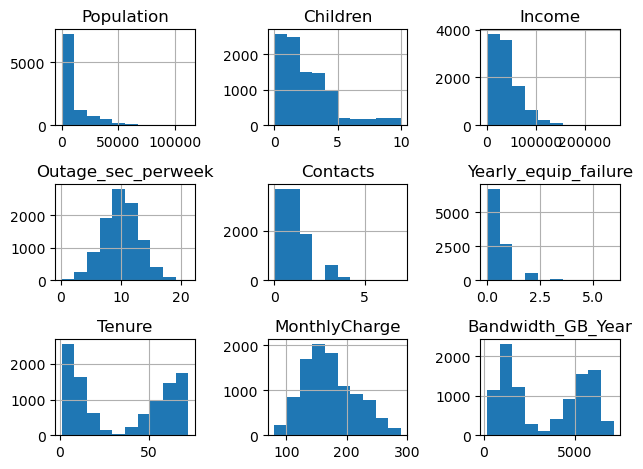

In [16]:
# Utilize Histograms for anomaly/outliers detection and feature visualization

Churn_df[['Population','Children','Income' , 'Outage_sec_perweek',  'Contacts', 'Yearly_equip_failure', 'Tenure', 'MonthlyCharge', 'Bandwidth_GB_Year' ]].hist()
plt.savefig ('churn_pyplot.jpg')
plt.tight_layout()

<Axes: >

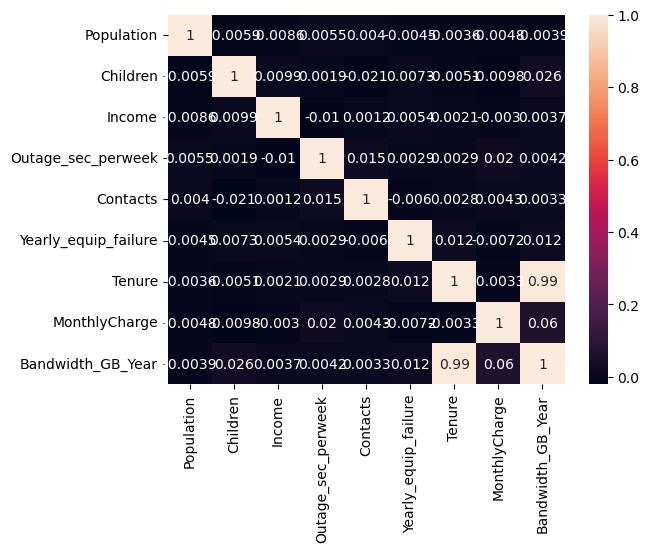

In [17]:
#Analysing the Correlation  /Relationship analysis

Cor_data=Churn_df[['Population','Children','Income' , 'Outage_sec_perweek',  'Contacts', 'Yearly_equip_failure', 'Tenure', 'MonthlyCharge', 'Bandwidth_GB_Year' ]]
Corelation = Cor_data.corr()
sns.heatmap(Corelation, annot=True)

C:\Users\beatr\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
C:\Users\beatr\AppData\Local\Temp\ipykernel_32424\59234986.py:8: UserWarning: The figure layout has changed to tight


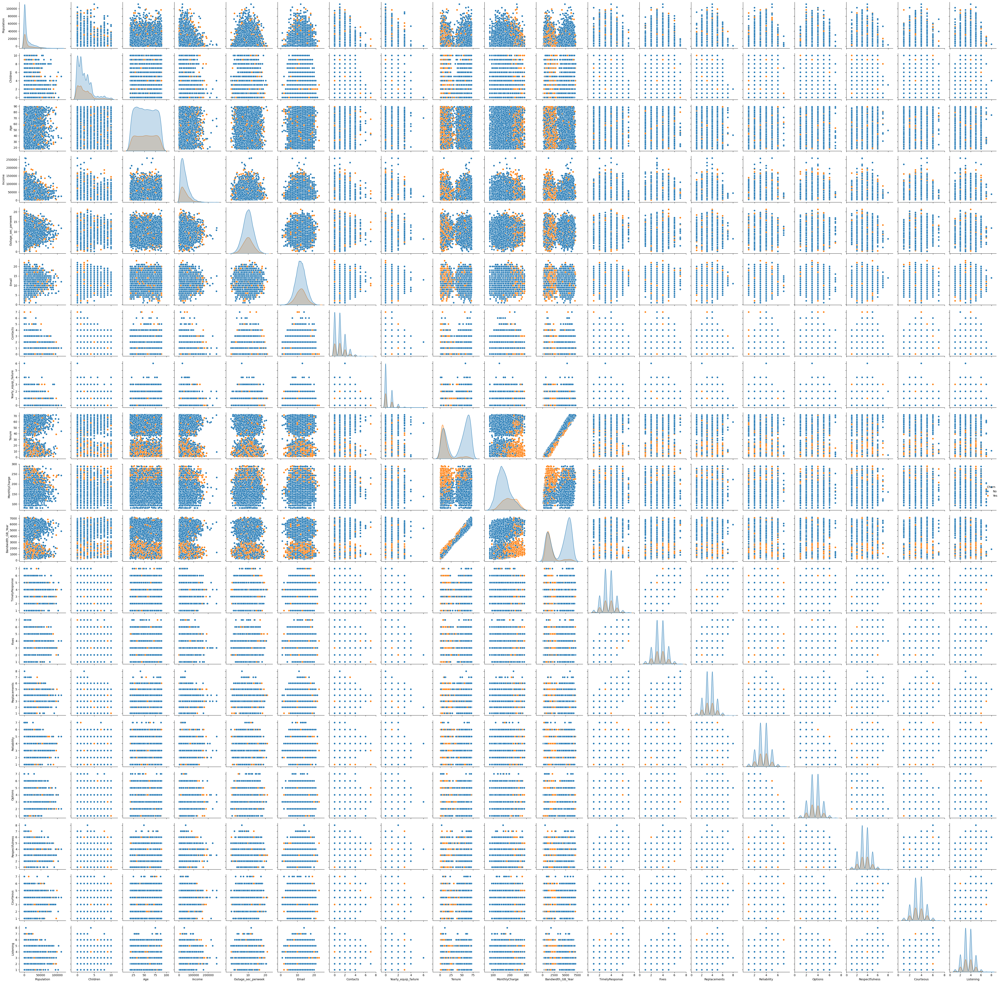

In [18]:
#Using Pairplot to show correlation/ Relationship

# Convert infinite values to NaN

Churn_df.replace([np.inf, -np.inf], np.nan, inplace=True)

sns.pairplot(Churn_df, hue="Churn")
plt.tight_layout()

In [19]:
#B : ANALYSIS OF DATASET USING CHI SQUARE
#Chi- sQuare Test

#Extract Churn Ratio
Churn_Ratio =Churn_df['PaymentMethod'].value_counts()
# Perform Chi-square test
chi= stats.chisquare(Churn_Ratio)
print(chi)

# Test significance
alpha= 0.05
if chi[1] < alpha:
    print("Difference between PaymentMethod is statistically significant")
else:
    print("No significant difference between PaymentMethod found")

Power_divergenceResult(statistic=439.1336, pvalue=7.371814027426512e-95)
Difference between PaymentMethod is statistically significant


In [20]:
#C Identify the distribution of two continuous variables and two categorical variables using univariate statistics
#from your cleaned and prepared data. 

# UNIVARIATE ANALYSIS:CATEGORICAL VARIABLE 1



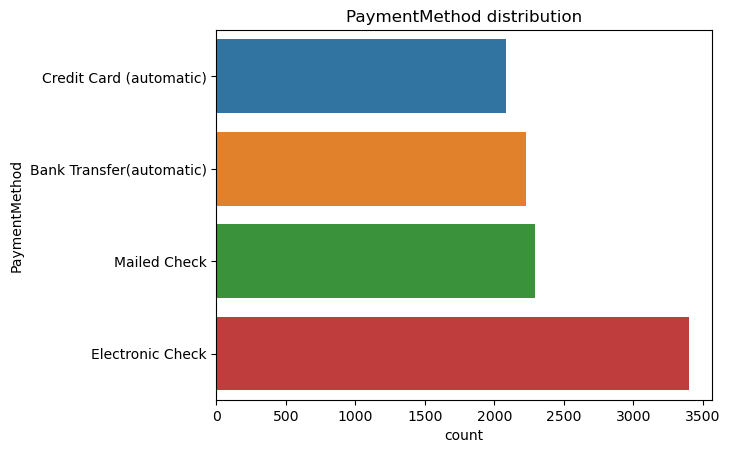

           PaymentMethod
count              10000
unique                 4
top     Electronic Check
freq                3398

PaymentMethod
Bank Transfer(automatic)    2229
Credit Card (automatic)     2083
Electronic Check            3398
Mailed Check                2290
Name: PaymentMethod, dtype: int64


In [24]:
print('# UNIVARIATE ANALYSIS:CATEGORICAL VARIABLE 1')
print('')
# C UNIVARIATE ANALYSIS
#CATEGORICAL VARIABLE 1
plt.title('PaymentMethod distribution')
sns.countplot(data=Churn_df, y="PaymentMethod",hue="PaymentMethod")
plt.show()
print(Churn_df[['PaymentMethod']].describe())

print('')
print(Churn_df.groupby('PaymentMethod')['PaymentMethod'].count())

# UNIVARIATE ANALYSIS:CATEGORICAL VARIABLE 1



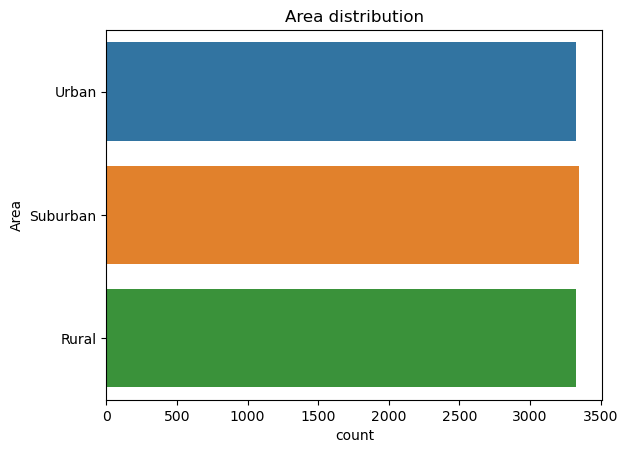

Area distribution
            Area
count      10000
unique         3
top     Suburban
freq        3346

Area
Rural       3327
Suburban    3346
Urban       3327
Name: Area, dtype: int64


In [23]:
print('# UNIVARIATE ANALYSIS:CATEGORICAL VARIABLE 1')
print('')
# C UNIVARIATE ANALYSIS
#CATEGORICAL VARIABLE 2
plt.title('Area distribution')
sns.countplot(data=Churn_df, y="Area",hue="Area")
plt.show()
#churn_plot.show()
print('Area distribution')
print(Churn_df[['Area']].describe())
print('')
print(Churn_df.groupby('Area')['Area'].count())

# UNIVARIATE ANALYSIS:CONTINOUS VARIABLE 1



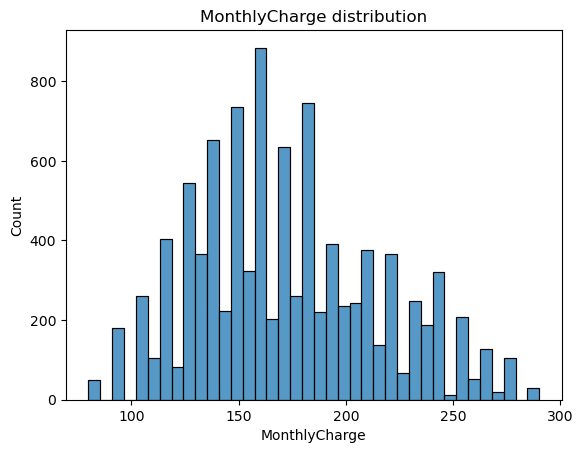

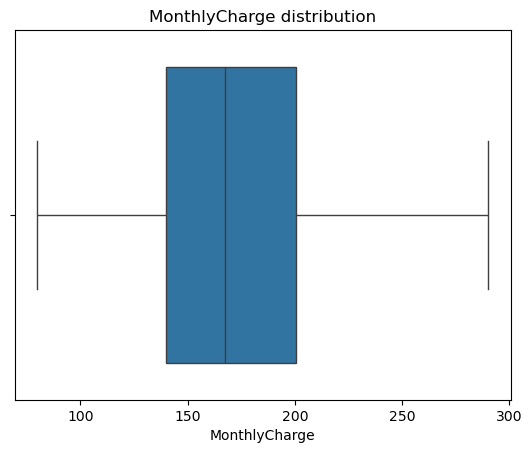

count    10000.000000
mean       172.624816
std         42.943094
min         79.978860
25%        139.979239
50%        167.484700
75%        200.734725
max        290.160419
Name: MonthlyCharge, dtype: float64


In [21]:
print('# UNIVARIATE ANALYSIS:CONTINOUS VARIABLE 1')
print('')

# C UNIVARIATE ANALYSIS
#CONTINOUS VARIABLE 1
plt.title('MonthlyCharge distribution')
MonthlyChargeDF =Churn_df[['MonthlyCharge']]

sns.histplot(MonthlyChargeDF,x='MonthlyCharge')

plt.show() 
plt.title('MonthlyCharge distribution')
sns.boxplot( data=Churn_df, x='MonthlyCharge')
plt.show()
print( Churn_df['MonthlyCharge'].describe())

# UNIVARIATE ANALYSIS:CONTINOUS VARIABLE 2



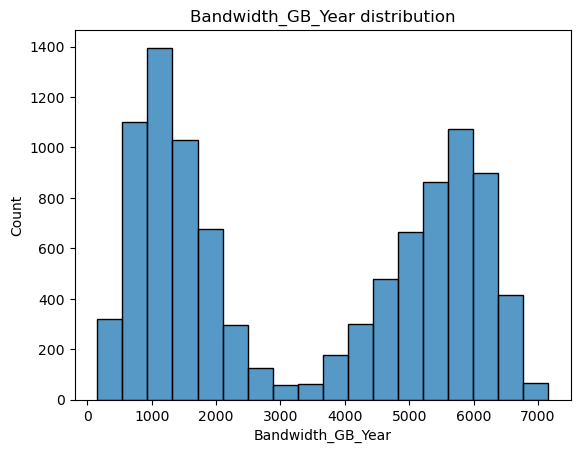

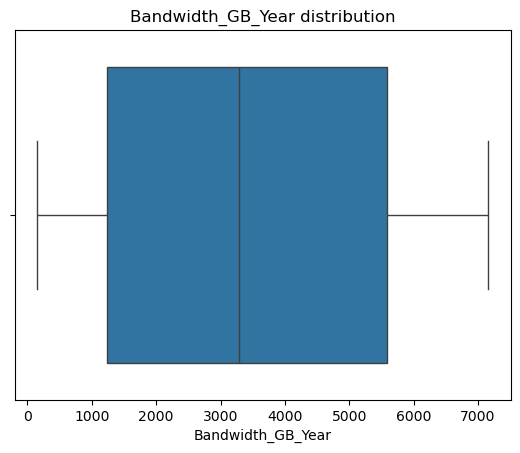

count    10000.000000
mean      3392.341550
std       2185.294852
min        155.506715
25%       1236.470827
50%       3279.536903
75%       5586.141370
max       7158.981530
Name: Bandwidth_GB_Year, dtype: float64


In [22]:
print('# UNIVARIATE ANALYSIS:CONTINOUS VARIABLE 2')
print('')

# C UNIVARIATE ANALYSIS
#CONTINOUS VARIABLE 1
plt.title('Bandwidth_GB_Year distribution')
TenureDF =Churn_df[['Bandwidth_GB_Year']]

sns.histplot(TenureDF,x='Bandwidth_GB_Year')

plt.show() 
plt.title('Bandwidth_GB_Year distribution')
sns.boxplot( data=Churn_df, x='Bandwidth_GB_Year')
plt.show()
print( Churn_df['Bandwidth_GB_Year'].describe())

In [25]:
#Identify the distribution of two continuous variables and two categorical variables using bivariate statistics from 
#your cleaned and prepared data.

# BIVARIATE ANALYSIS:CONTINOUS VARIABLE 1


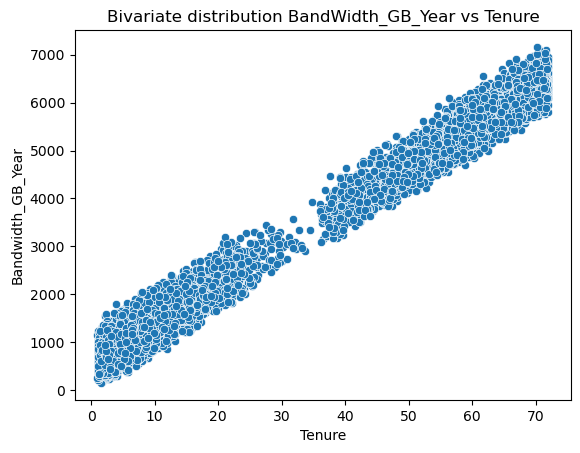

             Tenure  Bandwidth_GB_Year
count  10000.000000       10000.000000
mean      34.526188        3392.341550
std       26.443063        2185.294852
min        1.000259         155.506715
25%        7.917694        1236.470827
50%       35.430507        3279.536903
75%       61.479795        5586.141370
max       71.999280        7158.981530


In [26]:
# BIVARIATE ANALYSIS  
#CONTINOUS VARIABLE 1
print('# BIVARIATE ANALYSIS:CONTINOUS VARIABLE 1')


plt.title('Bivariate distribution BandWidth_GB_Year vs Tenure')
sns.scatterplot(data=Churn_df, x='Tenure', y='Bandwidth_GB_Year')
plt.show()
print(Churn_df[['Tenure','Bandwidth_GB_Year']].describe())

# BIVARIATE ANALYSIS:CONTINOUS VARIABLE 2


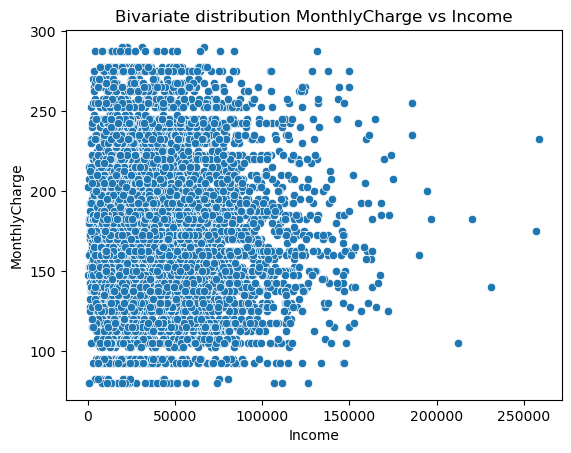

       MonthlyCharge         Income
count   10000.000000   10000.000000
mean      172.624816   39806.926771
std        42.943094   28199.916702
min        79.978860     348.670000
25%       139.979239   19224.717500
50%       167.484700   33170.605000
75%       200.734725   53246.170000
max       290.160419  258900.700000


In [27]:
# BIVARIATE ANALYSIS  
#CONTINOUS VARIABLE 2

print('# BIVARIATE ANALYSIS:CONTINOUS VARIABLE 2')
plt.title('Bivariate distribution MonthlyCharge vs Income')
sns.scatterplot(data=Churn_df, x='Income', y='MonthlyCharge')
plt.show()
print(Churn_df[['MonthlyCharge','Income']].describe())

# BIVARIATE ANALYSIS:CATEGORICAL VARIABLE 1



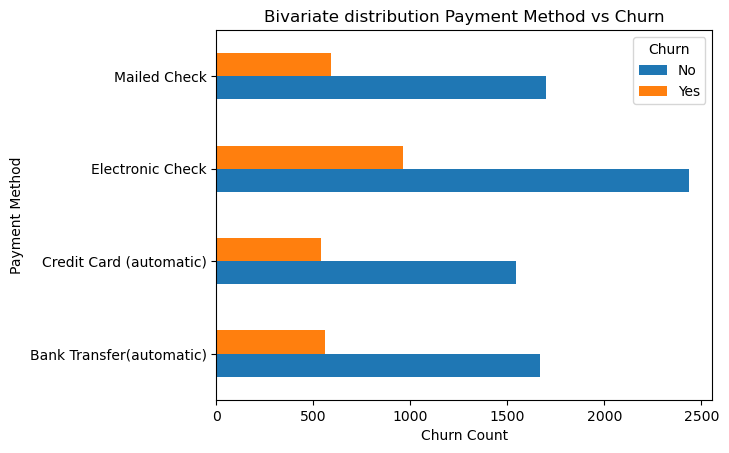

Churn                       No  Yes
PaymentMethod                      
Bank Transfer(automatic)  1671  558
Credit Card (automatic)   1543  540
Electronic Check          2435  963
Mailed Check              1701  589
           PaymentMethod  Churn
count              10000  10000
unique                 4      2
top     Electronic Check     No
freq                3398   7350


In [28]:
# BIVARIATE ANALYSIS  
#CATEGORICAL VARIABLE 1
print('# BIVARIATE ANALYSIS:CATEGORICAL VARIABLE 1')
print('')

Count = pd.crosstab(Churn_df['PaymentMethod'], Churn_df['Churn'])
Count.plot(kind='barh', stacked=False)
plt.title('Bivariate distribution Payment Method vs Churn')
plt.ylabel('Payment Method')
plt.xlabel('Churn Count')
plt.legend(title='Churn')
plt.show()
# C Checking Distribution of Churn for the PaymentMethod
print(pd.crosstab(Churn_df['PaymentMethod'], Churn_df['Churn']))
print(Churn_df[['PaymentMethod','Churn']].describe())


# BIVARIATE ANALYSIS:CATEGORICAL VARIABLE 2



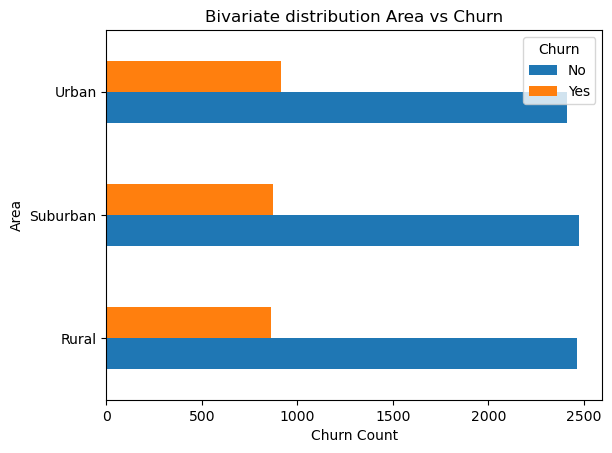

            Area  Churn
count      10000  10000
unique         3      2
top     Suburban     No
freq        3346   7350
Churn       No  Yes
Area               
Rural     2464  863
Suburban  2473  873
Urban     2413  914


In [29]:
# BIVARIATE ANALYSIS  
#CATEGORICAL VARIABLE 2
print('# BIVARIATE ANALYSIS:CATEGORICAL VARIABLE 2')
print('')

Count = pd.crosstab(Churn_df['Area'], Churn_df['Churn'])
Count.plot(kind='barh', stacked=False)
plt.title('Bivariate distribution Area vs Churn')
plt.ylabel('Area')
plt.xlabel('Churn Count')
plt.legend(title='Churn')

plt.show()
print(Churn_df[['Area','Churn']].describe())
print(pd.crosstab(Churn_df['Area'], Churn_df['Churn']))

